In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import shutil
import cv2
import os
from tqdm import tqdm
%pip install ultralytics
import ultralytics
ultralytics.checks()
dataset_path="/kaggle/input/amlcw-splitdataset"

Ultralytics YOLOv8.2.14 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5597.6/8062.4 GB disk)


In [7]:
with open(f"{dataset_path}/ultralytics/data/mad.yaml", "r") as f:
    train_yaml=f.read()
with open(f"{dataset_path}/ultralytics/data/test.yaml", "r") as f:
    test_yaml=f.read()
    
train_yaml=train_yaml.replace("/kaggle/working", dataset_path)
test_yaml=test_yaml.replace("/kaggle/working", dataset_path)

with open(f"/kaggle/working/train.yaml","w") as f:
    f.write(train_yaml)
with open(f"/kaggle/working/test.yaml","w") as f:
    f.write(test_yaml)

In [8]:
from ultralytics import YOLO

model = YOLO('yolov8m.pt')
result=model.train(
    name='YOLOv8m_1',
    device=0,
    epochs=10,
    imgsz=640,
    batch=32,
    # augmentation
    close_mosaic=0,
    hsv_h=0.02,
    hsv_s=0.75,
    hsv_v=0.45,
    degrees=0.1,
    translate=0.25,
    scale=0.55,
    shear=0.1,
    perspective=0.0,
    flipud=0.1,
    fliplr=0.5,
    mosaic=1.0,
    mixup=0.5,
    data=f'/kaggle/working/train.yaml',
)

100%|██████████| 49.7M/49.7M [00:00<00:00, 81.3MB/s]


Ultralytics YOLOv8.2.14 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/kaggle/working/train.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=YOLOv8m_1, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=Tr

100%|██████████| 755k/755k [00:00<00:00, 4.01MB/s]
2024-05-13 13:08:59,956	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-05-13 13:09:00,724	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-05-13 13:09:03.229001: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-13 13:09:03.229103: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-13 13:09:03.366935: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS facto

Overriding model.yaml nc=80 with nc=49

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytic

100%|██████████| 6.23M/6.23M [00:00<00:00, 21.1MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/amlcw-splitdataset/ultralytics/data/train/labels... 11896 images, 0 backgrounds, 45 corrupt: 100%|██████████| 11941/11941 [00:41<00:00, 287.61it/s]

train: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/train/images/08b11baa46e2d9185dd9ee4af5ce89fc.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/amlcw-splitdataset/ultralytics/data/train/images/08b11baa46e2d9185dd9ee4af5ce89fc.jpg'
train: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/train/images/1e8b43deca87d25180aba67557735c01.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/amlcw-splitdataset/ultralytics/data/train/images/1e8b43deca87d25180aba67557735c01.jpg'
train: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/train/images/2044a7ebe3d8132a8bce492f42bbde1d.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/amlcw-splitdataset/ultralytics/data/train/images/2044a7ebe3d8132a8bce492f42bbde1d.jpg'
train: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/train/images/2790a93ba1210aaaa09931b951d2376a.jpg: ignoring corrupt image/lab

train: WARNING ⚠️ Cache directory /kaggle/input/amlcw-splitdataset/ultralytics/data/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/amlcw-splitdataset/ultralytics/data/valid/labels... 2115 images, 0 backgrounds, 10 corrupt: 100%|██████████| 2125/2125 [00:07<00:00, 266.99it/s]


val: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/valid/images/44a429b8b5a6165e21405347ed412649.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/amlcw-splitdataset/ultralytics/data/valid/images/44a429b8b5a6165e21405347ed412649.jpg'
val: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/valid/images/548f7e5aead26331a842402c2a2e1abf.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/amlcw-splitdataset/ultralytics/data/valid/images/548f7e5aead26331a842402c2a2e1abf.jpg'
val: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/valid/images/5ed8dd35ea5346ac1dc70a726411cd04.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/amlcw-splitdataset/ultralytics/data/valid/images/5ed8dd35ea5346ac1dc70a726411cd04.jpg'
val: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/valid/images/87825161a8c72af4e78e0a18be245e34.jpg: ignoring corrupt image/label: [Err

       1/10      15.4G      0.969      3.692      1.267        135        640: 100%|██████████| 372/372 [09:58<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [01:06<00:00,  1.95s/it]


                   all       2115       2355      0.151      0.168     0.0693     0.0589

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      15.3G     0.9158      2.816      1.214        130        640: 100%|██████████| 372/372 [10:02<00:00,  1.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [01:03<00:00,  1.86s/it]


                   all       2115       2355      0.229      0.292      0.154      0.133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      15.2G      0.894      2.526      1.193        120        640: 100%|██████████| 372/372 [09:59<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [01:00<00:00,  1.78s/it]


                   all       2115       2355      0.218      0.326      0.167      0.139

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      15.2G     0.8859      2.351      1.193        109        640: 100%|██████████| 372/372 [09:52<00:00,  1.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:59<00:00,  1.76s/it]


                   all       2115       2355      0.253      0.405      0.247      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      15.2G     0.8426      2.146      1.164        160        640: 100%|██████████| 372/372 [09:54<00:00,  1.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [01:01<00:00,  1.81s/it]


                   all       2115       2355      0.272      0.432      0.279      0.239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      15.2G      0.812       1.98      1.146         90        640: 100%|██████████| 372/372 [09:52<00:00,  1.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:59<00:00,  1.75s/it]


                   all       2115       2355      0.332      0.465      0.333      0.291

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      15.2G     0.7805      1.837      1.125        145        640: 100%|██████████| 372/372 [09:52<00:00,  1.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [01:00<00:00,  1.79s/it]


                   all       2115       2355      0.363      0.545      0.368      0.325

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      15.2G     0.7487      1.706      1.107        114        640: 100%|██████████| 372/372 [09:51<00:00,  1.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [01:01<00:00,  1.82s/it]


                   all       2115       2355      0.369      0.601      0.396      0.352

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      15.2G     0.7224      1.574      1.088        112        640: 100%|██████████| 372/372 [09:56<00:00,  1.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [01:00<00:00,  1.77s/it]


                   all       2115       2355      0.408       0.59      0.409      0.367

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      15.2G     0.6952      1.494      1.073        119        640: 100%|██████████| 372/372 [09:58<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:58<00:00,  1.73s/it]


                   all       2115       2355      0.409      0.653      0.428      0.388

10 epochs completed in 1.837 hours.
Optimizer stripped from runs/detect/YOLOv8m_1/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/YOLOv8m_1/weights/best.pt, 52.0MB

Validating runs/detect/YOLOv8m_1/weights/best.pt...
Ultralytics YOLOv8.2.14 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Model summary (fused): 218 layers, 25868131 parameters, 0 gradients, 78.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:57<00:00,  1.69s/it]


                   all       2115       2355       0.41      0.652      0.428      0.389
                   A10       2115         60      0.314       0.75        0.4      0.358
                 A400M       2115         41      0.381      0.829      0.495      0.447
                 AG600       2115         22      0.644      0.823      0.757      0.721
                  AV8B       2115         36      0.334      0.694       0.39      0.363
                    B1       2115         58      0.388      0.699      0.364      0.313
                    B2       2115         47      0.469      0.723       0.49      0.428
                   B52       2115         51      0.298      0.774      0.296      0.259
                 Be200       2115         26      0.761      0.923      0.788      0.733
                  C130       2115         99        0.3      0.697      0.289      0.234
                   C17       2115         56      0.375      0.571      0.393      0.362
                    C

In [9]:
!yolo val \
model='/kaggle/input/amlcw/runs/detect/YOLOv8m_1/weights/best.pt' \
data='/kaggle/working/test.yaml'\
batch=4 \
device=cuda:0 \
imgsz=640

Ultralytics YOLOv8.2.14 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Model summary (fused): 218 layers, 25868131 parameters, 0 gradients, 78.8 GFLOPs
val: Scanning /kaggle/input/amlcw-splitdataset/ultralytics/data/test/labels... 2
val: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/test/images/014240b10dffa805240c72655e357866.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/amlcw-splitdataset/ultralytics/data/test/images/014240b10dffa805240c72655e357866.jpg'
val: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/test/images/0659b84f8272d49753431dc808b8d4e1.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/amlcw-splitdataset/ultralytics/data/test/images/0659b84f8272d49753431dc808b8d4e1.jpg'
val: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/test/images/14dd66103e6399d3754f6bcb53fdead2.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/k

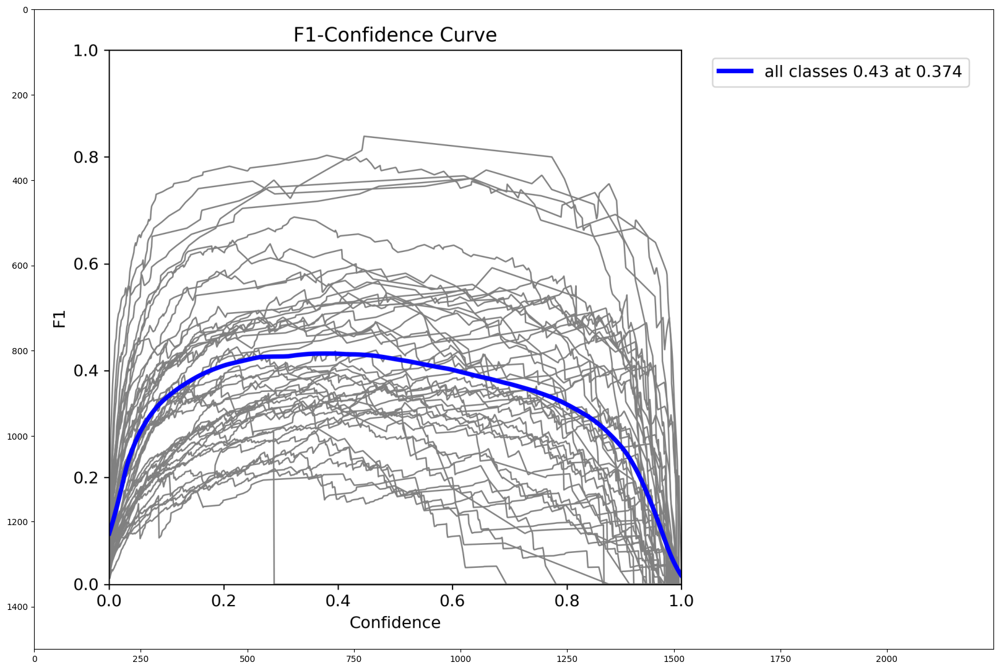

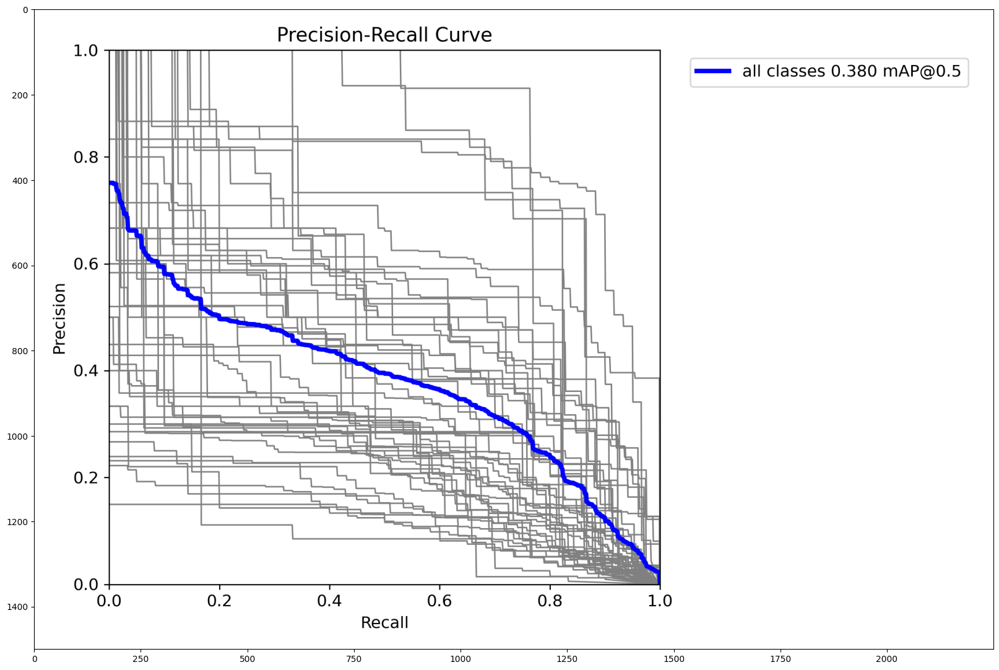

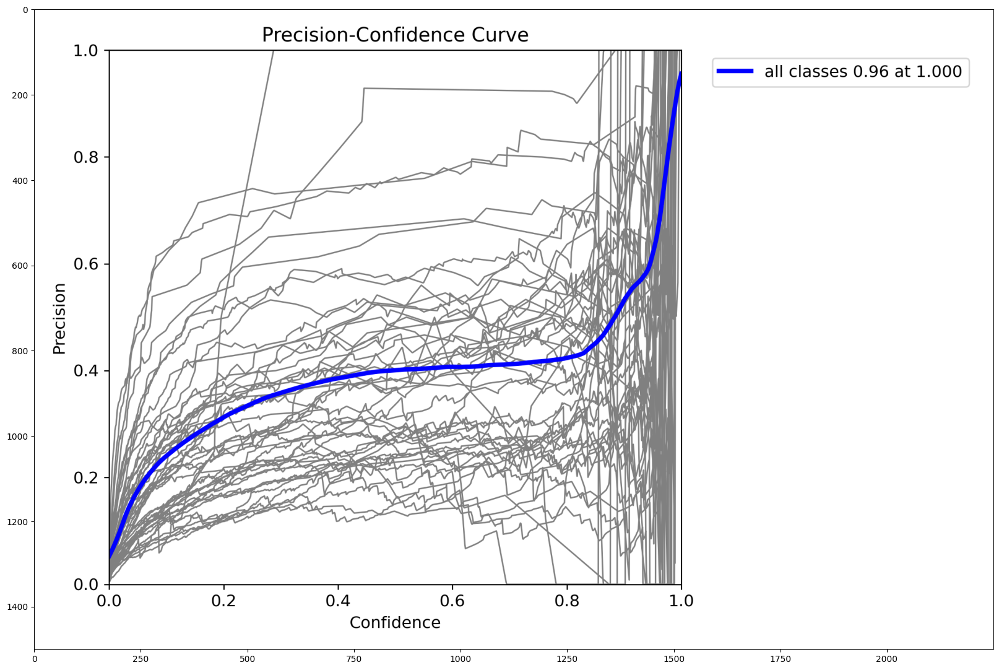

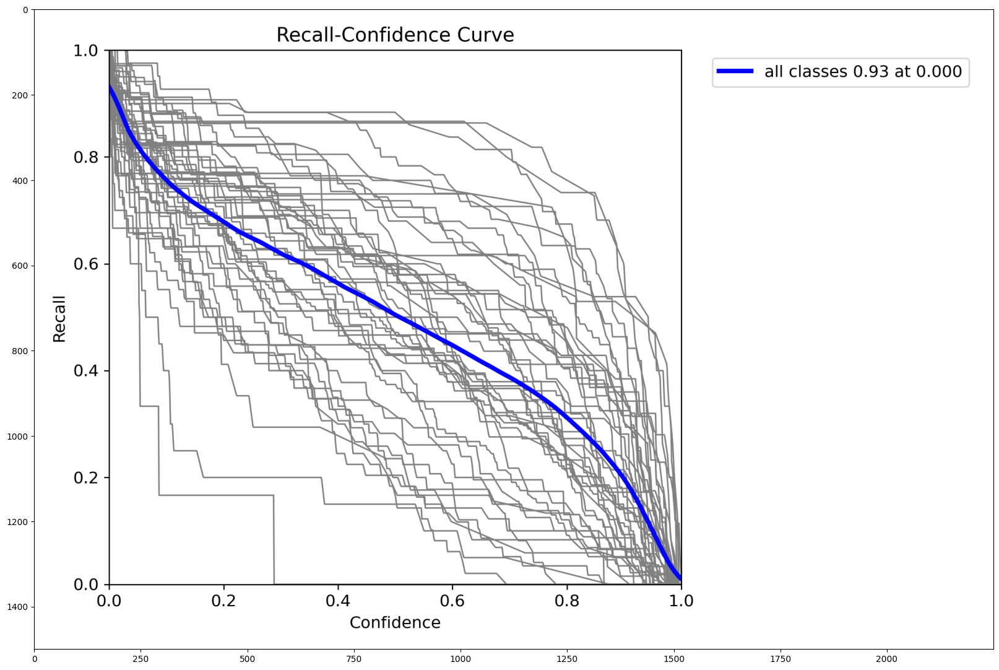

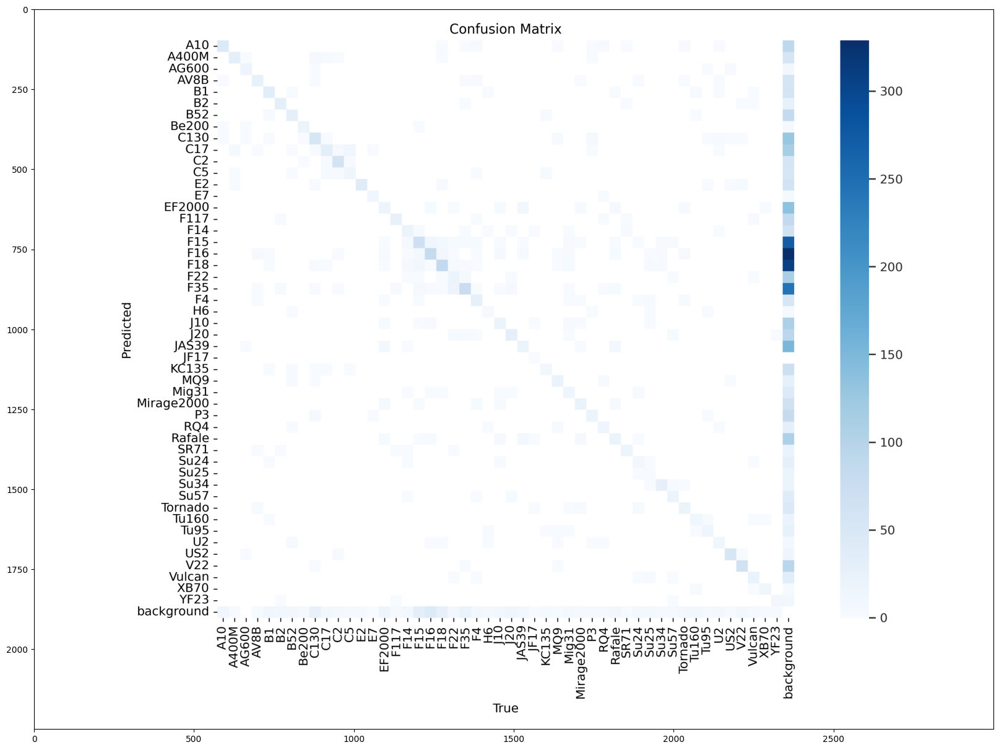

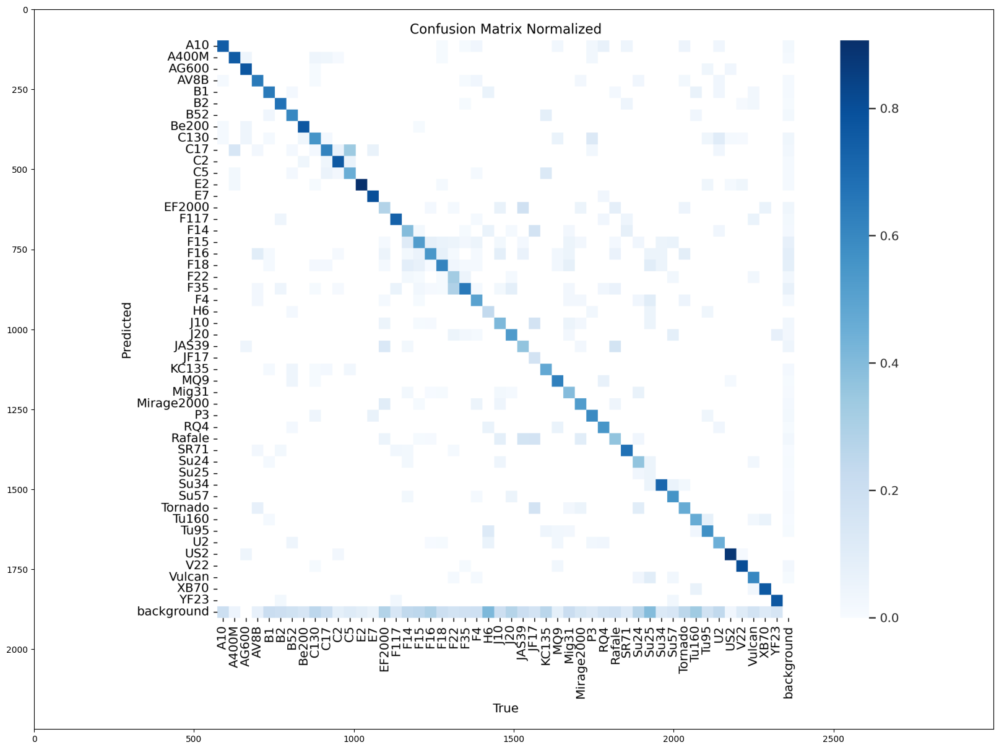

In [12]:
for path in sorted(glob.glob('/kaggle/working/runs/detect/val/*.png')):
    image = cv2.imread(path)[:,:,::-1]
    plt.figure(figsize=(20,20))
    plt.imshow(image)
    plt.show()

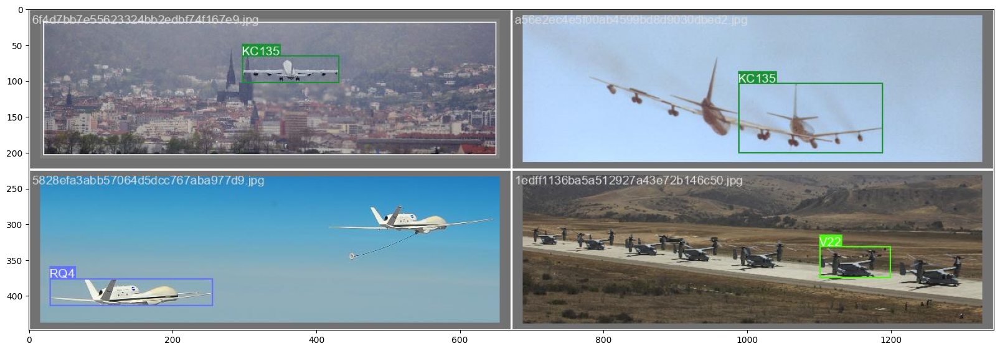

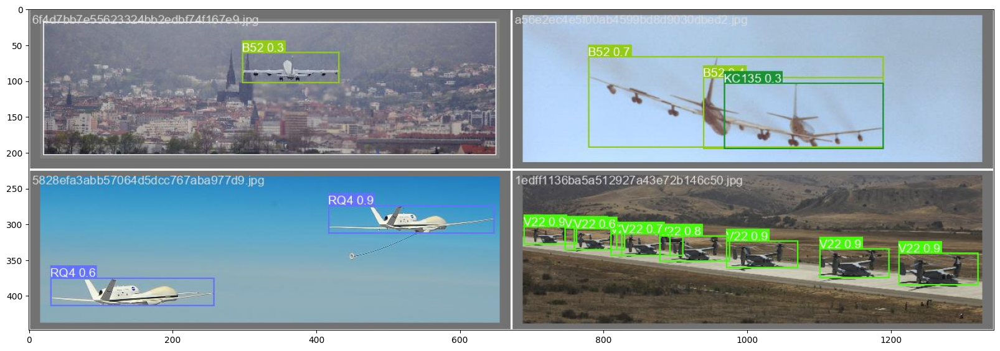

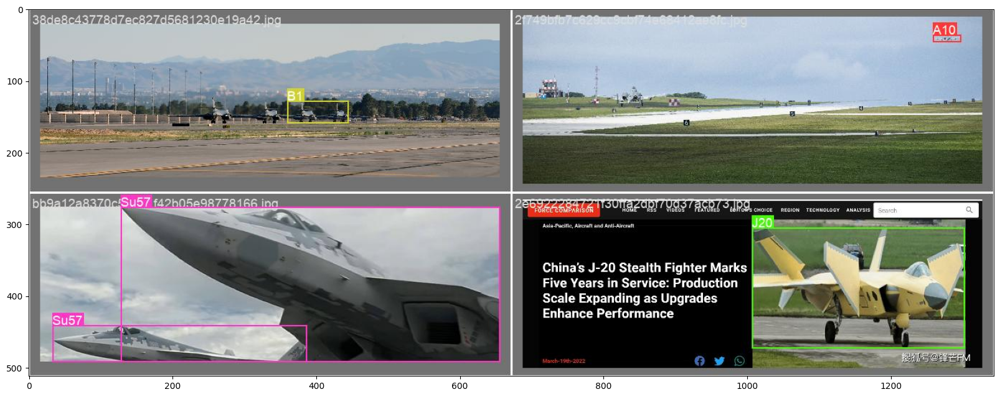

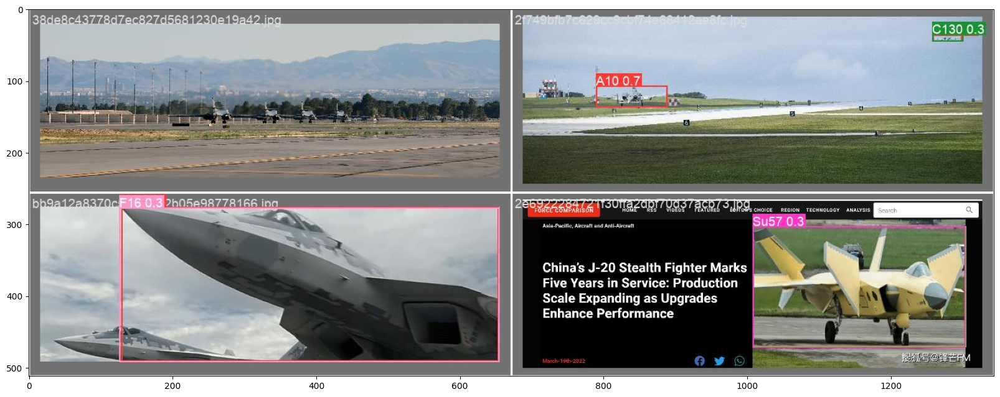

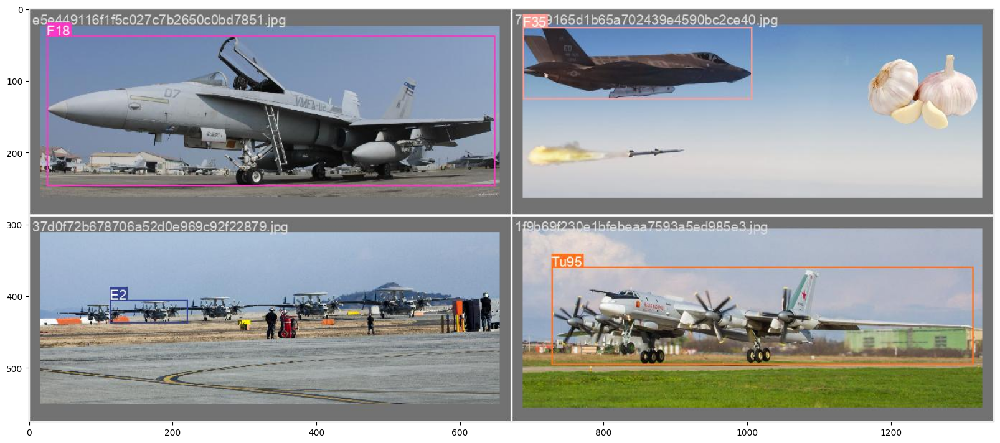

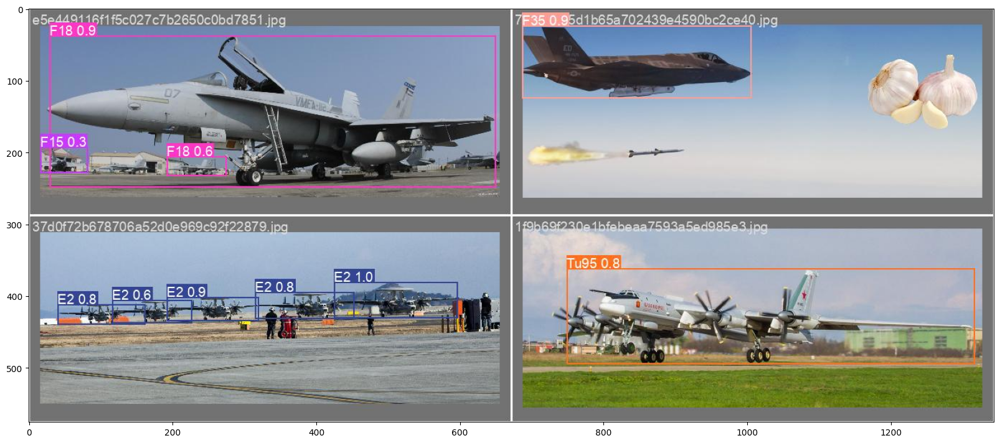

In [16]:
for path in sorted(glob.glob('/kaggle/working/runs/detect/val/*.jpg')):
    image = cv2.imread(path)[:,:,::-1]
    plt.figure(figsize=(20,20))
    plt.imshow(image)
    plt.show()